# CEE 690-02

# Environmental Spatial Data Analysis

# Lecture 16

# Classification

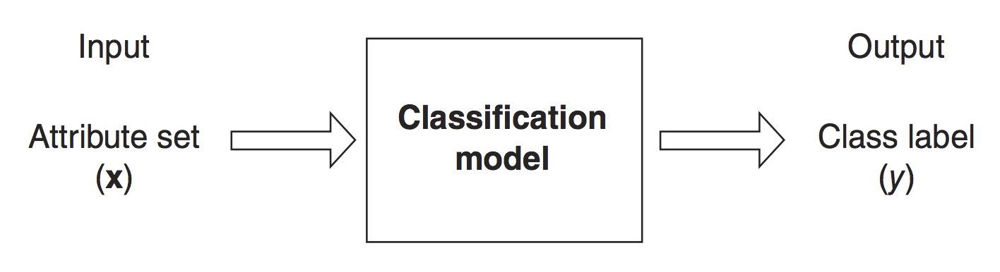

Source: https://www-users.cs.umn.edu/~kumar001/dmbook/ch3_classification.pdf

# Framework for building a classification model

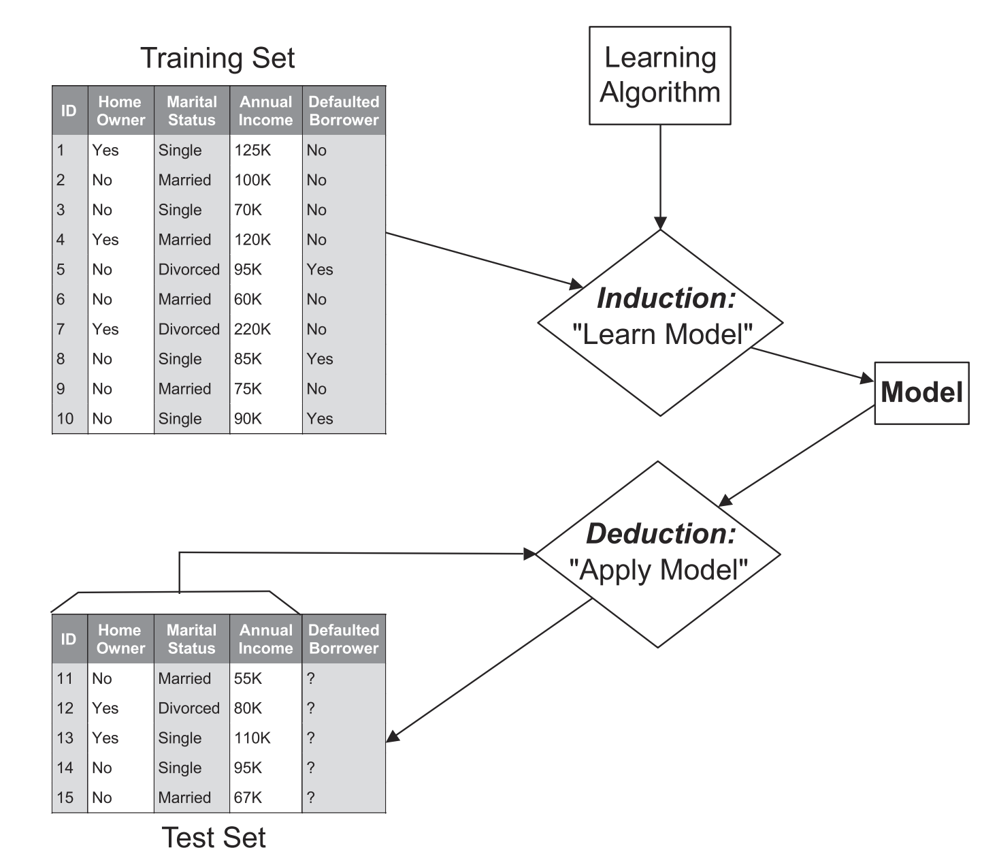

Source: https://www-users.cs.umn.edu/~kumar001/dmbook/ch3_classification.pdf

# Common evaluation metrics of classification models

$$ \textbf{Accuracy} = \frac{\text{Number of correct predictions}}{\text{Total number of predictions}} $$

$$ \textbf{Error rate} = \frac{\text{Number of wrong predictions}}{\text{Total number of predictions}} $$

# Classical example: Land cover types

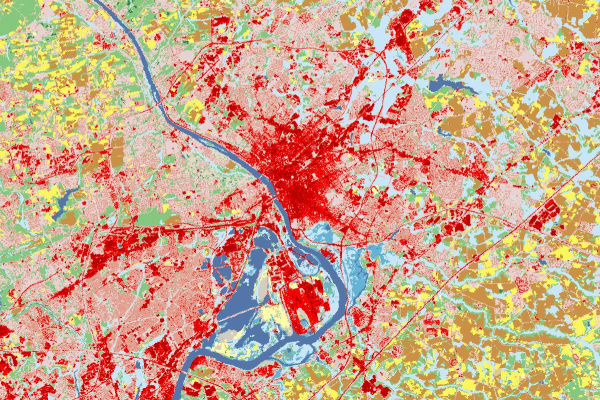

Source: National Land Cover Database (NLCD)

## But how are these maps created? 

* Collect reference database on the ground and then assemble a classification model that establishes a (generally non-linear) relationship between the classes and the spatially complete datasets (e.g., Landsat). 

* Decision trees (and their derivatives) are used very often for land feature classification. 

* Note that this is different from clustering. In this case, we have data to fit the model to (Supervised Learning).

# Tree-based methods

* Decision Trees
* Bagging
* Random Forests
* Extra Trees
* Gradient Boosting

We will focus primarily on classification for all these methods. At the end we will note how they can also be used for regression with only a few minor tweaks. 

# Study area: The Triad

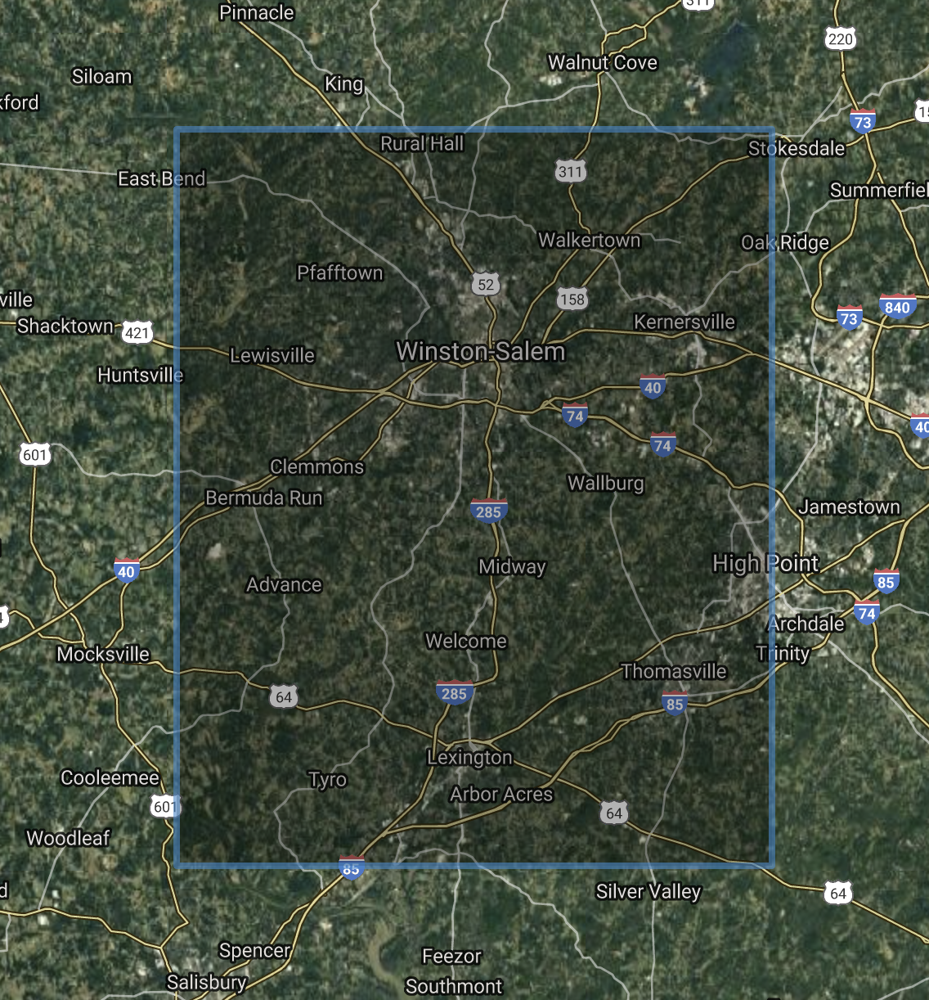

In [ ]:
%%bash
#Extract data for a chosen region
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band1_TOA_REF ../Workspace/WELD_Band1_TOA_REF.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band2_TOA_REF ../Workspace/WELD_Band2_TOA_REF.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band3_TOA_REF ../Workspace/WELD_Band3_TOA_REF.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band4_TOA_REF ../Workspace/WELD_Band4_TOA_REF.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band5_TOA_REF ../Workspace/WELD_Band5_TOA_REF.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band61_TOA_BT ../Workspace/WELD_Band61_TOA_BT.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band62_TOA_BT ../Workspace/WELD_Band62_TOA_BT.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:Band7_TOA_REF ../Workspace/WELD_Band7_TOA_REF.tif
gdalwarp -overwrite -s_srs EPSG:5070 -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 HDF4_EOS:EOS_GRID:"/data/WELD/CONUS.annual.2012.h26v11.doy003to352.v1.5.hdf":WELD_GRID:NDVI_TOA ../Workspace/WELD_NDVI_TOA.tif
gdalwarp -overwrite -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 /data/NLCD/NLCD_2016_Land_Cover_L48/NLCD_2016_Land_Cover_L48_20190424.img ../Workspace/nlcd_land_cover.tif
gdalwarp -overwrite -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 /data/NLCD/NLCD_2016_Impervious_L48/NLCD_2016_Impervious_L48_20190405.img ../Workspace/nlcd_impervious.tif
gdalwarp -overwrite -t_srs EPSG:4326 -r near -te -80.5 35.75 -80.0 36.25 -tr 0.001 0.001 /data/NLCD/NLCD_2016_Tree_Canopy_L48/NLCD_2016_Tree_Canopy_L48_20190831.img ../Workspace/nlcd_tree_canopy.tif


In [1]:
#Read in all the data
import rasterio
%matplotlib inline
import matplotlib.pyplot as plt
vars = ['WELD_Band1_TOA_REF','WELD_Band2_TOA_REF','WELD_Band3_TOA_REF','WELD_Band4_TOA_REF',
        'WELD_Band5_TOA_REF','WELD_Band61_TOA_BT','WELD_Band62_TOA_BT','WELD_Band7_TOA_REF',
        'WELD_NDVI_TOA','nlcd_land_cover','nlcd_impervious','nlcd_tree_canopy']
data = {}
for var in vars:
    src = rasterio.open('../Workspace/%s.tif' % var)
    data[var] = src.read(1)
    src.close()

# Plot the maps

1
WELD_Band1_TOA_REF (500, 500)
2
WELD_Band2_TOA_REF (500, 500)
3
WELD_Band3_TOA_REF (500, 500)
4
WELD_Band4_TOA_REF (500, 500)
5
WELD_Band5_TOA_REF (500, 500)
6
WELD_Band61_TOA_BT (500, 500)
7
WELD_Band62_TOA_BT (500, 500)
8
WELD_Band7_TOA_REF (500, 500)
9
WELD_NDVI_TOA (500, 500)
10
nlcd_impervious (500, 500)
11
nlcd_tree_canopy (500, 500)


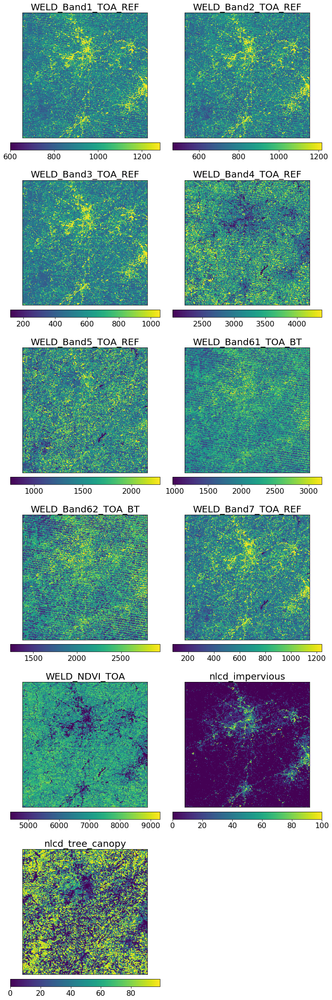

In [198]:
#Plot all the data
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(10,30))
i = 0
for var in data:
    if var in ['nlcd_land_cover']:continue
    i += 1
    print(i)
    print(var,data[var].shape)
    plt.subplot(6,2,i)
    plt.xticks([])
    plt.yticks([])
    if var not in ['nlcd_impervious','nlcd_tree_canopy']:
        vmin = np.mean(data[var]) - 2*np.std(data[var])
        vmax = np.mean(data[var]) + 2*np.std(data[var])
        plt.imshow(data[var],vmin=vmin,vmax=vmax)
    else:
        plt.imshow(data[var])
    cb = plt.colorbar(orientation='horizontal',pad=0.03)
    cb.ax.tick_params(labelsize=16)
    plt.title(var,fontsize=20)
plt.tight_layout()
plt.show()

# Plot the land cover map

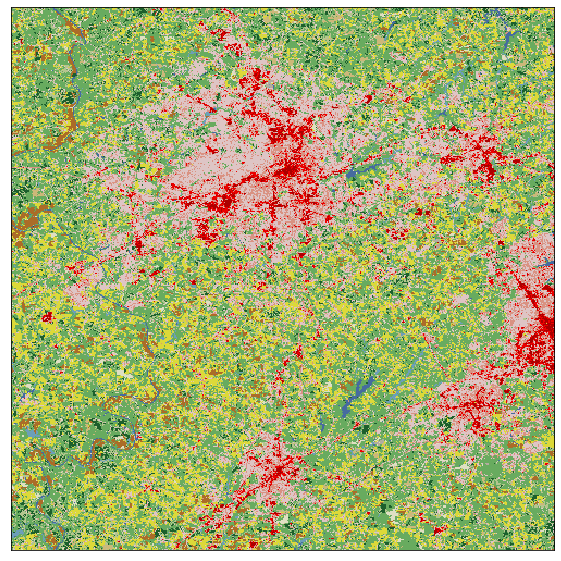

In [199]:
from matplotlib.colors import ListedColormap
import matplotlib as mpl
import numpy as np
src = rasterio.open("../Workspace/nlcd_land_cover.tif")
data['nlcd_land_cover'] = src.read(1)

# colormap determination and setting bounds
with rasterio.open("../Workspace/nlcd_land_cover.tif") as r:
    cmap_in = r.colormap(1)
    cmap1 = [[np.int(jj) for jj in cmap_in[ii]] for ii in cmap_in]
    cmap_in = [[np.float(jj)/255.0 for jj in cmap_in[ii]] for ii in cmap_in]
    indx_list = np.unique(data['nlcd_land_cover'])
    r_cmap = []    
    for ii in indx_list:
        r_cmap.append(cmap_in[ii])
    raster_cmap = ListedColormap(r_cmap) # defining the NLCD specific color map
    norm = mpl.colors.BoundaryNorm(indx_list, raster_cmap.N) # specifying colors based on num. unique points
    
plt.figure(figsize=(10,10))
plt.imshow(data['nlcd_land_cover'],cmap=raster_cmap,norm=norm)
plt.xticks([])
plt.yticks([])
plt.show()
src.close()

# Use a decision tree to reproduce the land cover map

Accuracy: 0.6333776396963465


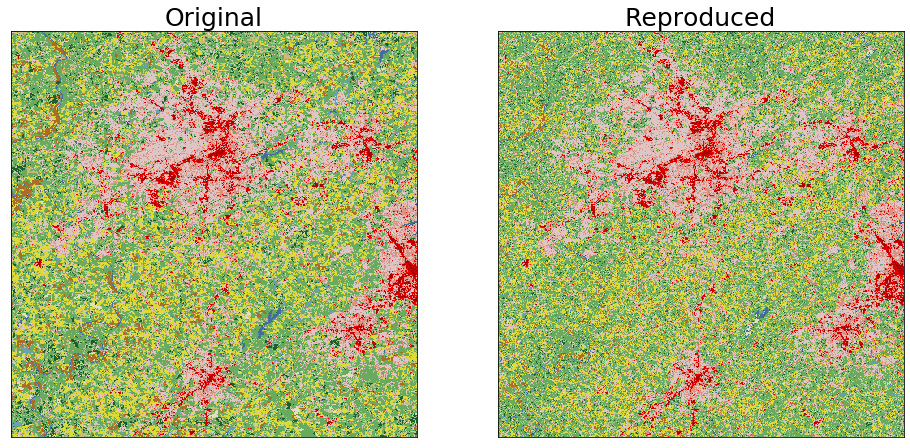

In [200]:
import sklearn.tree 

variable = 'nlcd_land_cover'
#Bring in the data
X = []
feature_names = []
for var in data:
    if var == variable:continue
    tmp = data[var].reshape(data[var].size)
    X.append(tmp)
    feature_names.append(var)
X = np.array(X).T
Y = data[variable].reshape(data[variable].size)
#Draw 2500 samples to define the training dataset
np.random.seed(1)
idx = np.random.choice(Y.size,2500)
m = np.zeros(Y.size).astype(np.int)
m[idx] = 1
m = m.astype(np.bool)
#Decision tree
clf = sklearn.tree.DecisionTreeClassifier()
#Fit the tree
clf = clf.fit(X[m,:],Y[m])
#Assess the accuracy using the validation dataset
print('Accuracy:',clf.score(X[~m,:],Y[~m]))
#Predict the classes at each pixel
Ypred = clf.predict(X[~m,:])
#Make the figure to compare the original to the reproduced
plt.figure(figsize=(16,28))
plt.subplot(122)
plt.title('Reproduced',fontsize=25)
plt.imshow(clf.predict(X).reshape(data['nlcd_land_cover'].shape),cmap=raster_cmap,norm=norm)
plt.xticks([])
plt.yticks([])
plt.subplot(121)
plt.title('Original',fontsize=25)
plt.imshow(data['nlcd_land_cover'],cmap=raster_cmap,norm=norm)
plt.xticks([])
plt.yticks([])
plt.show()

Far from perfect but a good start...

Where we are going? Ensemble decision tree methods (e.g., Random Forests)

Accuracy: 0.7256008629640552


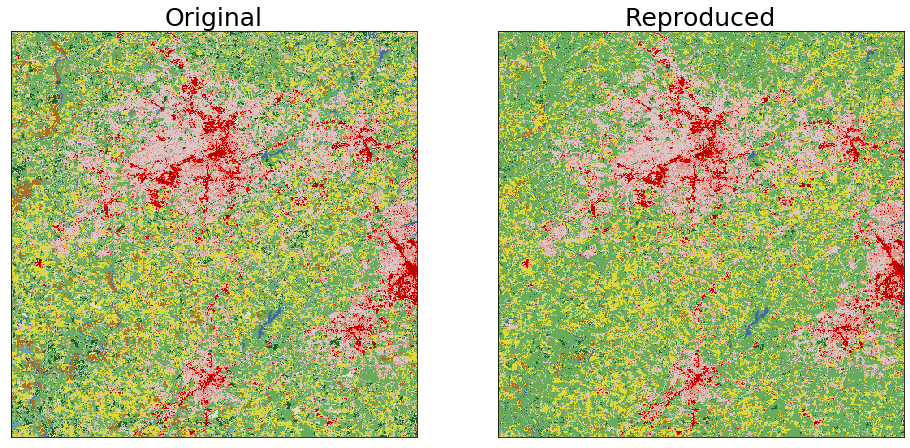

In [202]:
import sklearn.ensemble
#Random forest
clf = sklearn.ensemble.RandomForestClassifier(n_estimators=100)
#Fit the tree
clf = clf.fit(X[m,:],Y[m])
#Assess the accuracy using the validation dataset
print('Accuracy:',clf.score(X[~m,:],Y[~m]))
#Predict the classes at each pixel
Ypred = clf.predict(X[~m,:])
#Make the figure to compare the original to the reproduced
plt.figure(figsize=(16,28))
plt.subplot(122)
plt.title('Reproduced',fontsize=25)
plt.imshow(clf.predict(X).reshape(data['nlcd_land_cover'].shape),cmap=raster_cmap,norm=norm)
plt.xticks([])
plt.yticks([])
plt.subplot(121)
plt.title('Original',fontsize=25)
plt.imshow(data['nlcd_land_cover'],cmap=raster_cmap,norm=norm)
plt.xticks([])
plt.yticks([])
plt.show()

* Random forests still struggles with some features, but overall there is a strong improvement over classic decision trees (e.g., not as noisy). 

* We will find out next week why RFs (among other ensemble decision tree methods) outperform simple decision trees. 

* But today, we will focus on decision trees (which are the building block for the ensemble methods).

# Decision trees

It's a tree...

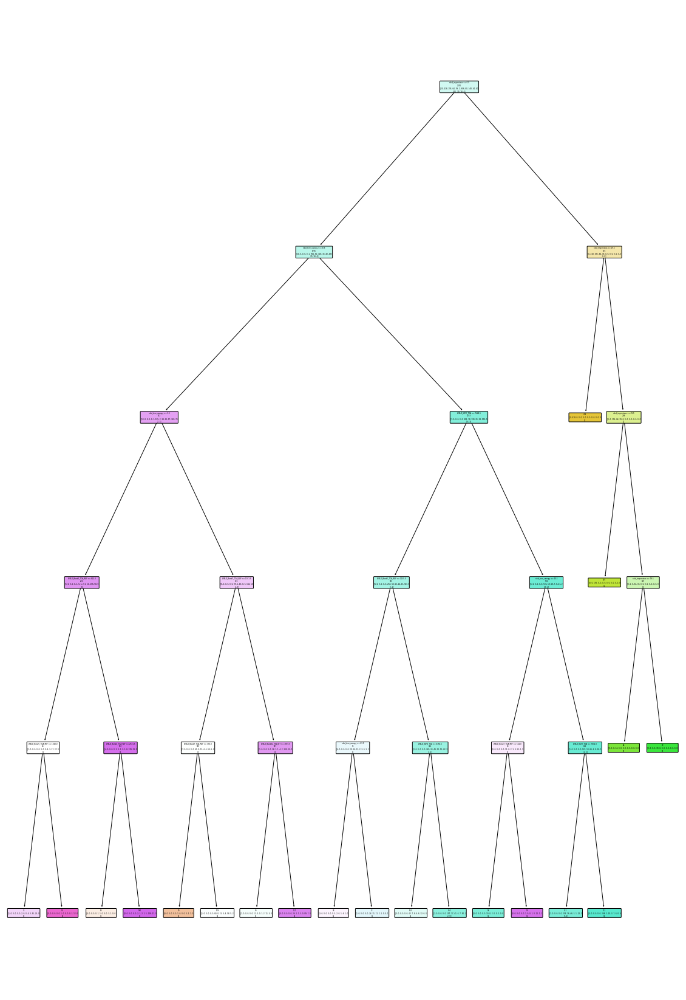

In [25]:
#Decision tree
clf = sklearn.tree.DecisionTreeClassifier(max_depth=5)
#Fit the tree
clf = clf.fit(X[m,:],Y[m])
#Plot the tree
plt.figure(figsize=(20,30))
sklearn.tree.plot_tree(clf,feature_names=feature_names,label='none',
                      filled=True,impurity=False,rounded=True)
plt.show()

Let's work with something that we can actually see

# Sklearn's Iris dataset

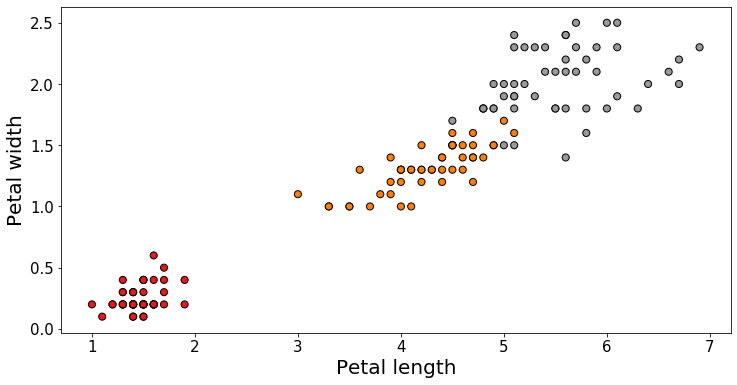

In [55]:
import sklearn.datasets
iris = sklearn.datasets.load_iris()
#Features space
X = iris.data
y = iris.target
# Plot the data
plt.figure(figsize=(12,6))
im = plt.scatter(X[:,2],X[:,3],c=y,s=50,cmap=plt.cm.Set1,edgecolor='k')
plt.xlabel('Petal length',fontsize=20)
plt.ylabel('Petal width',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

Let's now assume that we only have a subset of the obsevations.

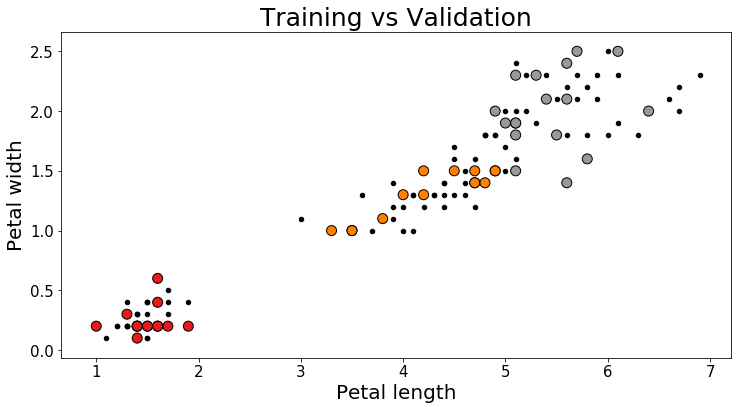

In [134]:
#Features space
X = iris.data[:,2:4]
#Observed classes
y = iris.target
#Feature names
feature_names = iris.feature_names[2:4]
#Define the indices from which to draw samples to define the training dataset
np.random.seed(1)
nsamples = 50
idx = np.random.choice(y.size,nsamples)
m = np.zeros(y.size).astype(np.int)
m[idx] = 1
m = m.astype(np.bool)
#Divide into training and validation
Xt = X[m,:]
yt = y[m]
Xv = X[~m,:]
yv = y[~m]
# Plot the data
plt.figure(figsize=(12,6))
plt.scatter(Xv[:,0],Xv[:,1],c='k',s=20)
plt.scatter(Xt[:,0],Xt[:,1],c=yt,s=100,cmap=plt.cm.Set1,edgecolor='k')
plt.xlabel('Petal length',fontsize=20)
plt.ylabel('Petal width',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Training vs Validation',fontsize=25)
plt.show()

* Large dots are the training data (i.e., we know the class associated with the given features). 

* Small black dots are unknown

# Let's use a decision tree to classify the unknown points

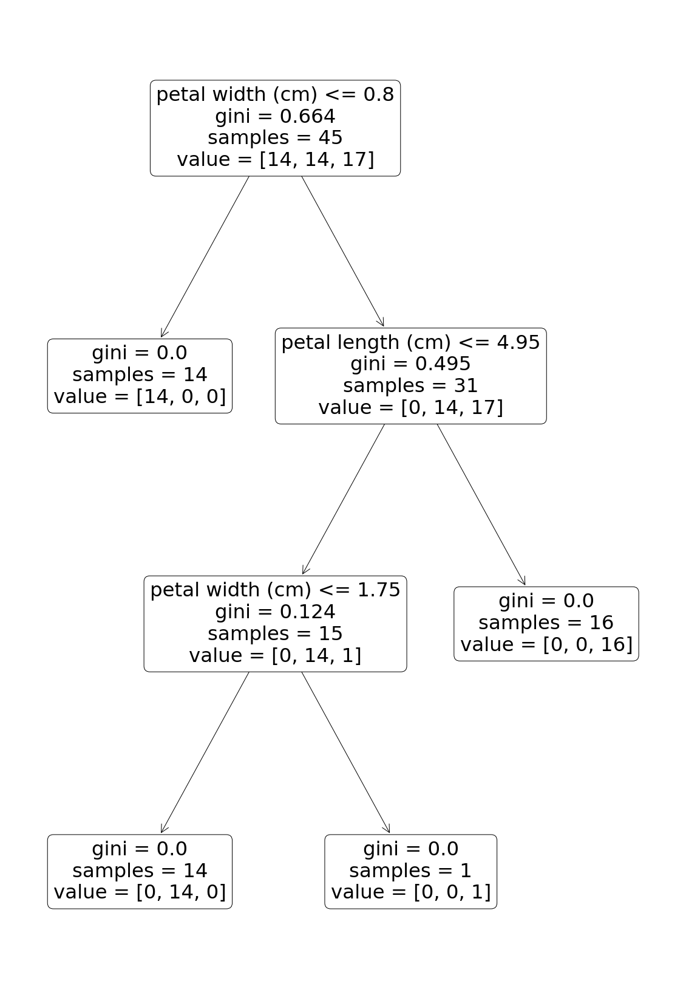

In [135]:
#Decision tree
clf = sklearn.tree.DecisionTreeClassifier(random_state=1)
#Fit the tree
clf = clf.fit(Xt,yt)
#Plot the tree
plt.figure(figsize=(20,30))
sklearn.tree.plot_tree(clf,feature_names=feature_names,label='all',rounded=True)
plt.show()

Hopefully by the end of today, you understand:
    
* How the nodes are constructed
* And what the different variables/parameters described in the nodes mean
* Who is "gini"?, What is "value"?, What is "samples"?

# Goal: We ultimately use the decision tree to predict

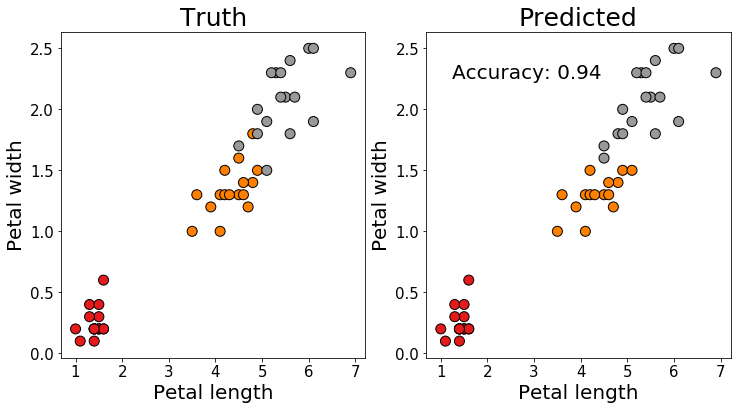

In [120]:
#Predict
yp = clf.predict(Xv)
# Plot the data
plt.figure(figsize=(12,6))
plt.subplot(121)
plt.scatter(Xv[:,0],Xv[:,1],c=yv,s=100,cmap=plt.cm.Set1,edgecolor='k')
plt.xlabel('Petal length',fontsize=20)
plt.ylabel('Petal width',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Truth',fontsize=25)
plt.subplot(122)
plt.scatter(Xv[:,0],Xv[:,1],c=yp,s=100,cmap=plt.cm.Set1,edgecolor='k')
plt.xlabel('Petal length',fontsize=20)
plt.ylabel('Petal width',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Predicted',fontsize=25)
plt.text(1.25,2.25,'Accuracy: %.2f'%clf.score(Xv,yv),fontsize=20)
plt.show()

# Nodes in a decision tree

* **Root node**: No incoming links and zero or more outgoing links.
* **Internal nodes**: Each has exactly one incoming link and two or more outgoing links.
* **Leaf or terminal nodes**: Each has exactly one incoming link and no outgoing links.

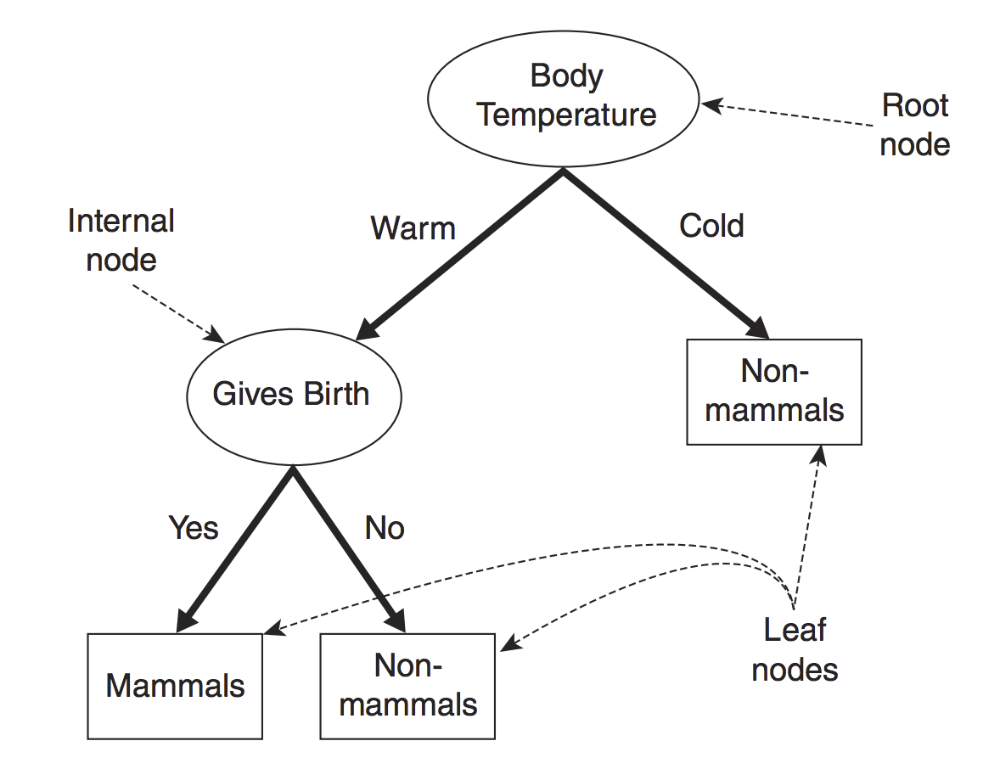

The root node and internal nodes make the decisions based on the data, and the leaf nodes provides the prediction.

Given the large complexity that emerges due to feature selection at each node and the value at which to make a split, many different decision trees can emerge from the same dataset (with many times very different predictions!). 

Over the years, multiple algorithms have emerged to provide the best possible decision trees while ensuring computational feasibility (which is critical...).

# Hunt's algorithm: Original basis for most common decision tree algorithms

* Start at the top and break based on some splitting criterion
* Recursive algorithm 
* Continues until all the labels at a given node are the same (or we tell it to stop at a certain recursion level).

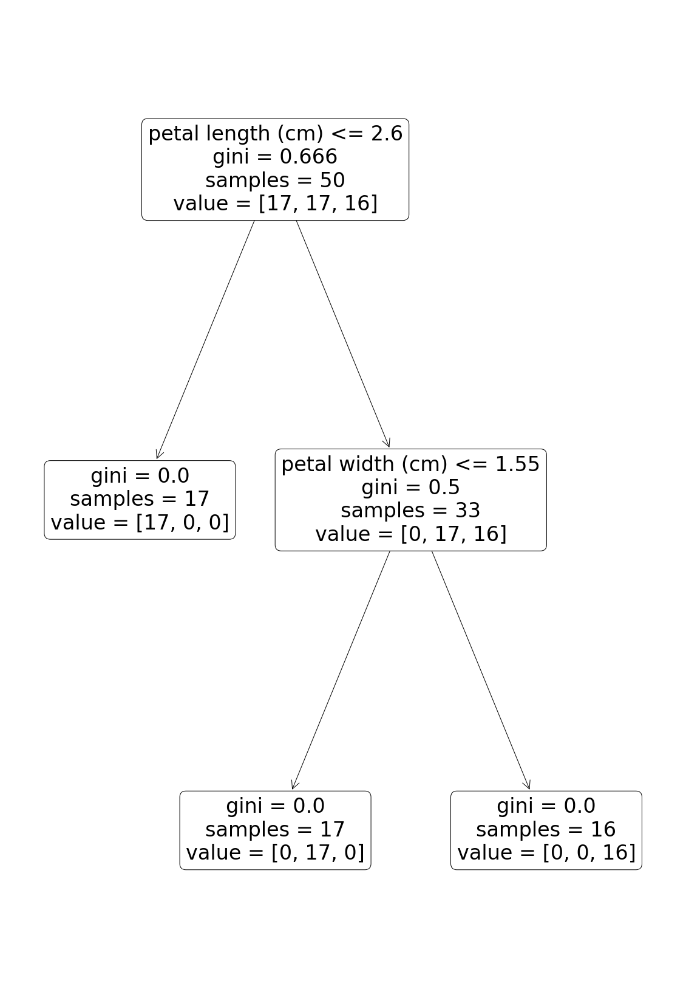

# Where decision tree algorithms differ

* **Splitting criterion** - At each recursive step, an attribute must be selected to partition the training instances associated with a node into smaller subsets associated with its child nodes. The splitting criterion determines which attribute is chosen as the test condition and how the training instances should be distributed to the child nodes.


* **Stopping criterion** - The basic algorithm stops expanding a node only when all the training instances associated with the node have the same class labels or have identical attribute values. Although these conditions are sufficient, there are reasons to stop expanding a node much earlier even if the leaf node contains training instances from more than one class. The most common reasons for stopping early is to minimize overfitting and to ensure computational tractability.

# Methods for expressing attribute test conditions

## Binary attributes

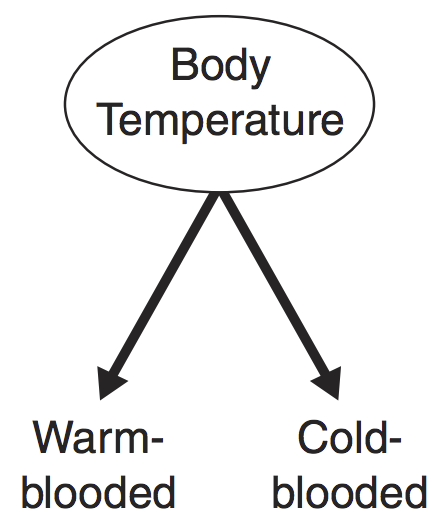

## Nominal attributes

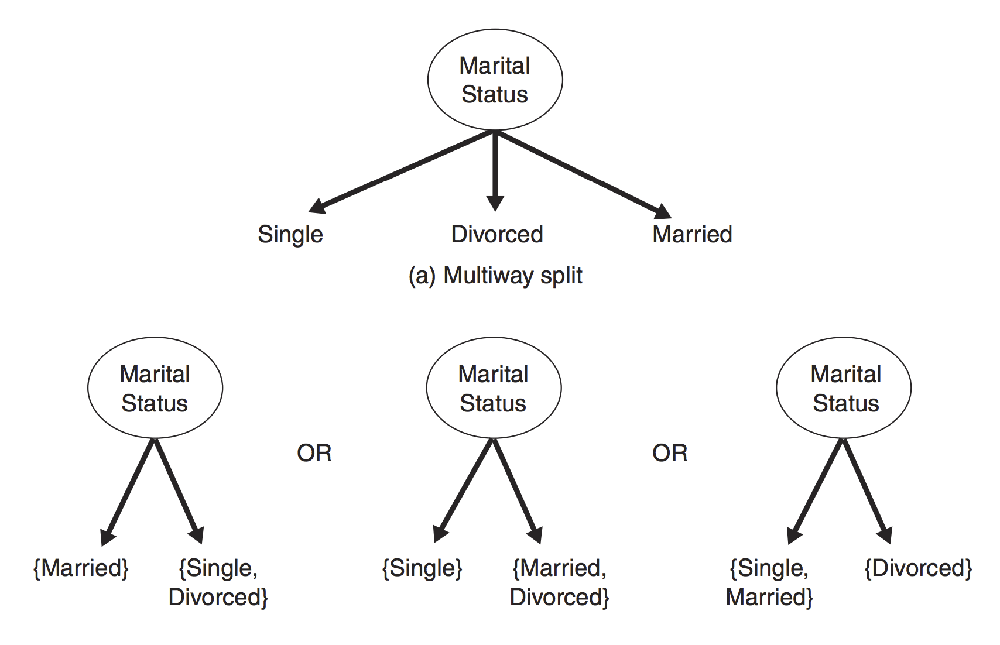

## Ordinal attributes

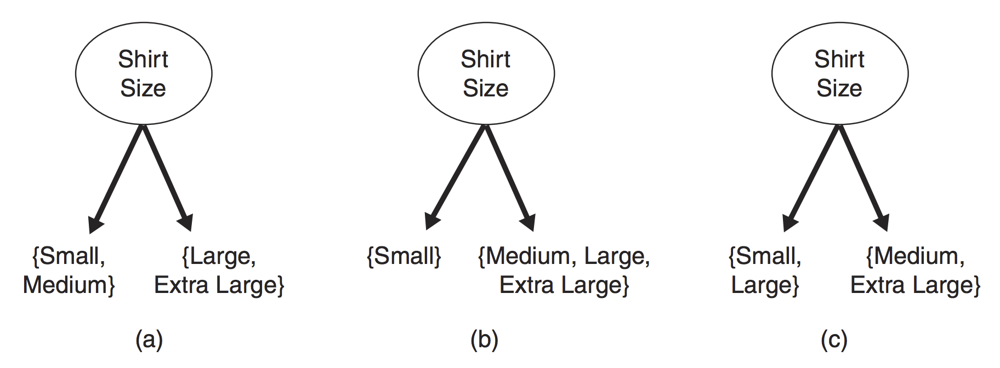

## Continuous attributes

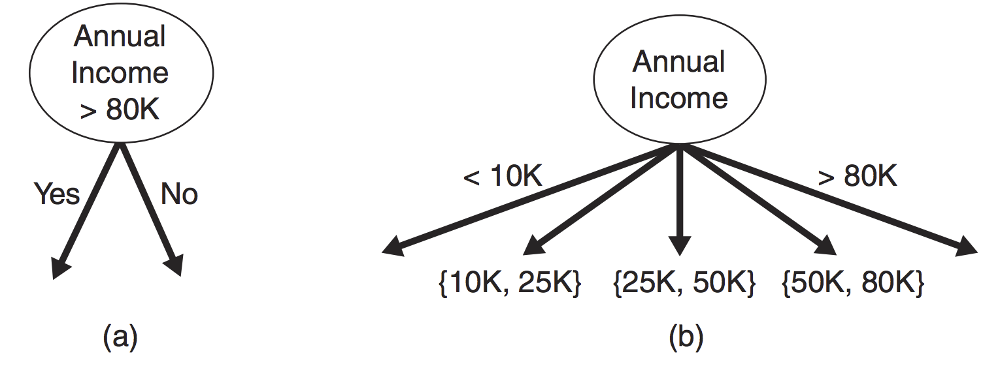

# Measures to evaluate an attribute test condition

We use measures to determine how best to split a node to obtain "pure" nodes as soon as possible. Having large decision trees is not a good thing. It is a sure way to overfit. 

# Impurity measures for a single node

The impurity of a node measures how dissimilar the class labels are for the data instances belonging to a common node.

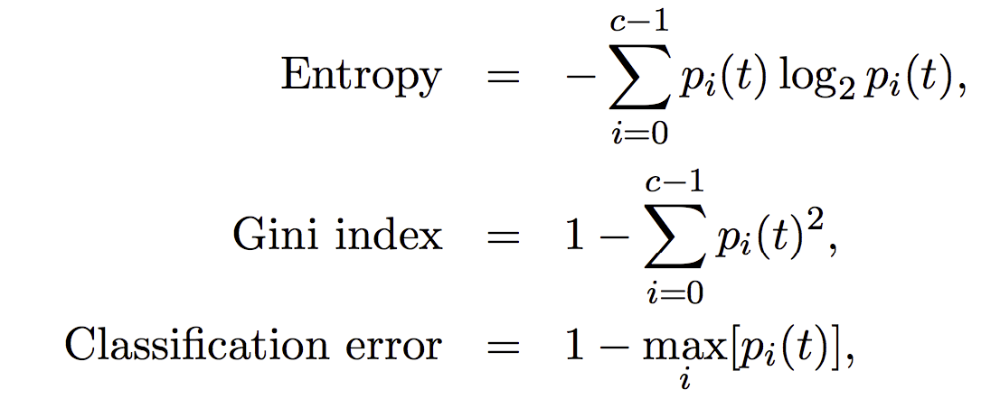

# Examples of impurity measures

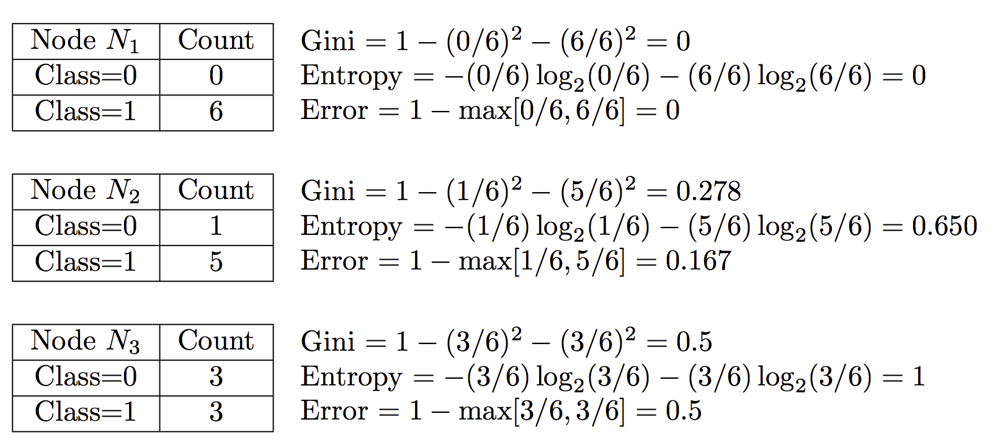

# Comparision of impurity measures for a binary classification problem

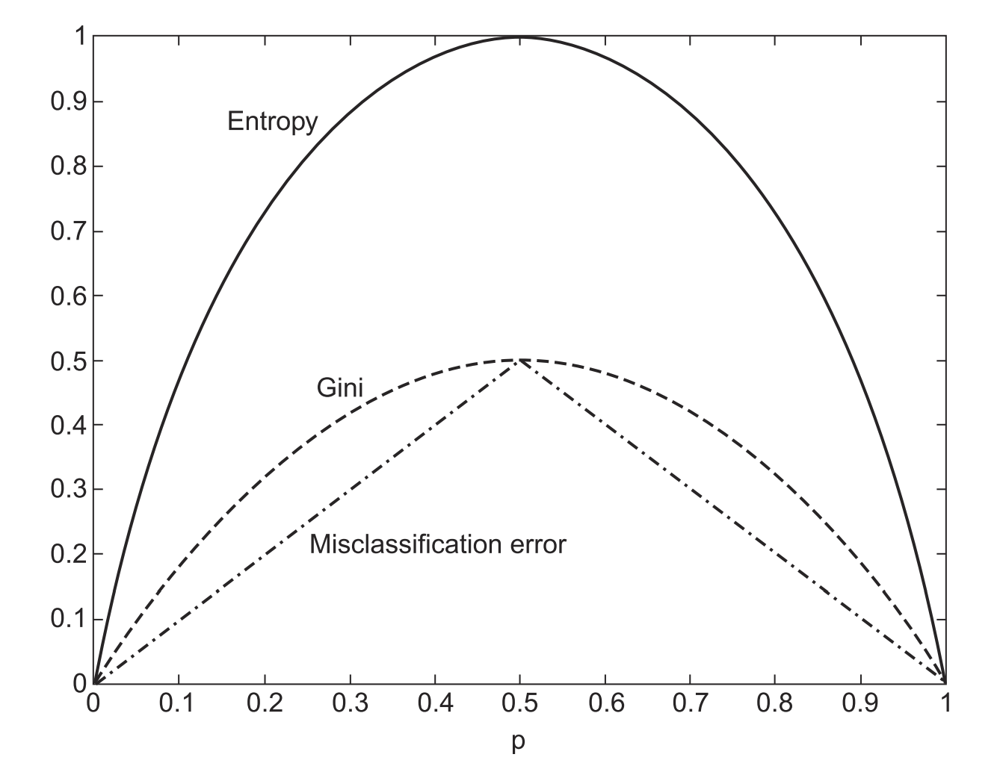

# Identifying the best test attribute condition

To determine the goodness of an attribute test condition, we need to compare the degree of impurity of the parent node (before splitting) with the weighted degree of impurity of the child nodes (after splitting). The larger their difference, the better the test condition. This is measured by the gain in "purity" ($\Delta$) at each node. 

$$\Delta = I(\text{parent}) - I(\text{childern})$$

# Example of splitting decision

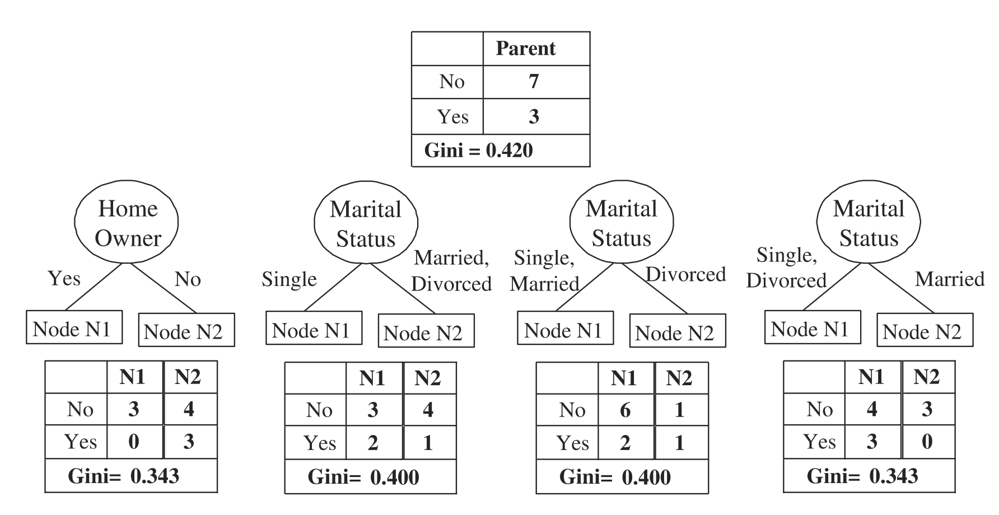

# Optimizing splits for continuous variables

* In principle, an infinite number of values between the minimum and maximum could be used to split a node when using a attribute that is a continuous variable.

* In practice, the split is made using only the values of the continuous variable that are in the training dataset. 

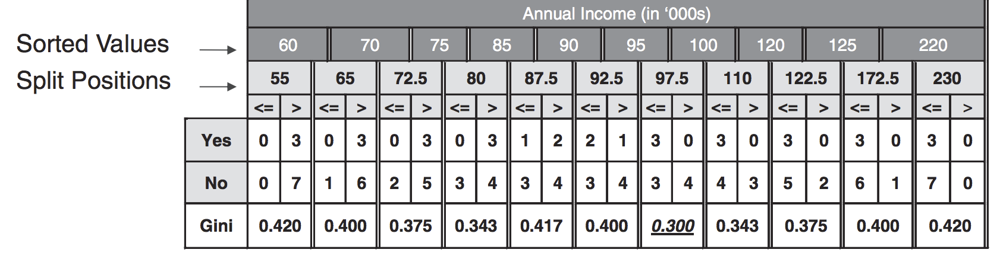

# Gini importance (feature importance)

Total decrease in node impurity caused by a given attribute normalized by the total sum of decrease in node impurity caused by all attributes.

Let's show this via an example:

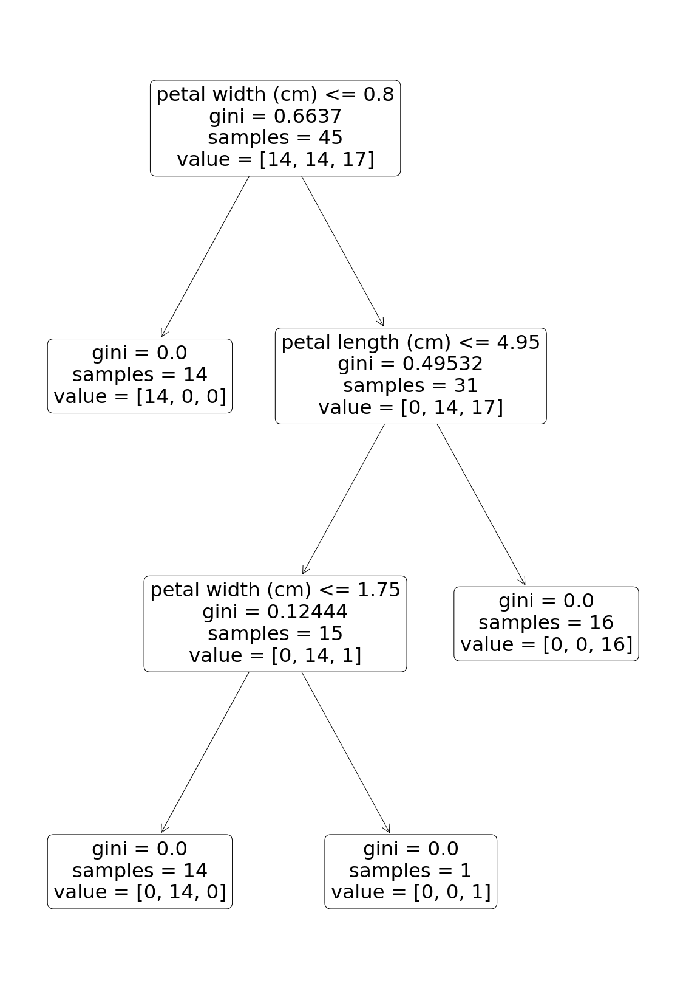

In [150]:
#Decision tree
clf = sklearn.tree.DecisionTreeClassifier(random_state=1)
#Fit the tree
clf = clf.fit(Xt,yt)
#Plot the tree
plt.figure(figsize=(20,30))
sklearn.tree.plot_tree(clf,feature_names=feature_names,label='all',rounded=True,precision=5)
plt.show()

In [188]:
print(feature_names)
print(clf.feature_importances_)

['petal length (cm)', 'petal width (cm)']
[0.4516129 0.5483871]


# Summary characteristics of decision trees

* **Applicability**: Non-parametric approach where the features can be discrete or continuous data. 

* **Computational efficiency**: The fitting of the decision tree is fast. The slowdowns tend to occur when evaluating the decision tree

* **Handling missing values**: By design, decision trees are fairly robust to missing values and can even incorporate them when assembling the node splits

* **Handling irrelevant attributes**: By aiming to purify each node, the algorithm already reduces in importance (summarized via the Gini Importance) the attributes that don't have an impact on the end result.

* **Redundant attributes**: When making a split, a decision tree will choose between two highly correlated variables. As such, redundancy in the information doesn't really impact the end result excessively.

# Model overfitting

* Decision trees are able to fit training data very well (too well actually).
* They are notorious for creating non-sensical relationships that are inappropriate when applied to the test data.


## Overfitting example: Creating a training dataset

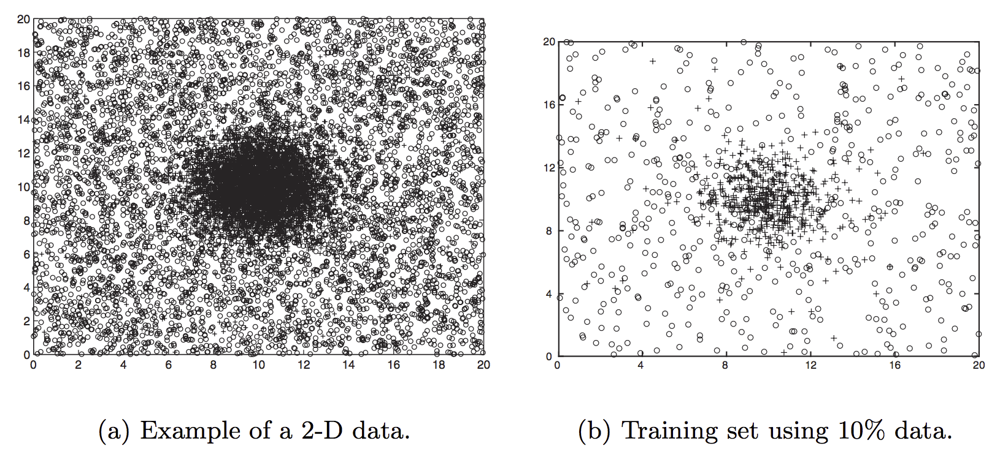

## Growing and evaluating the decision tree

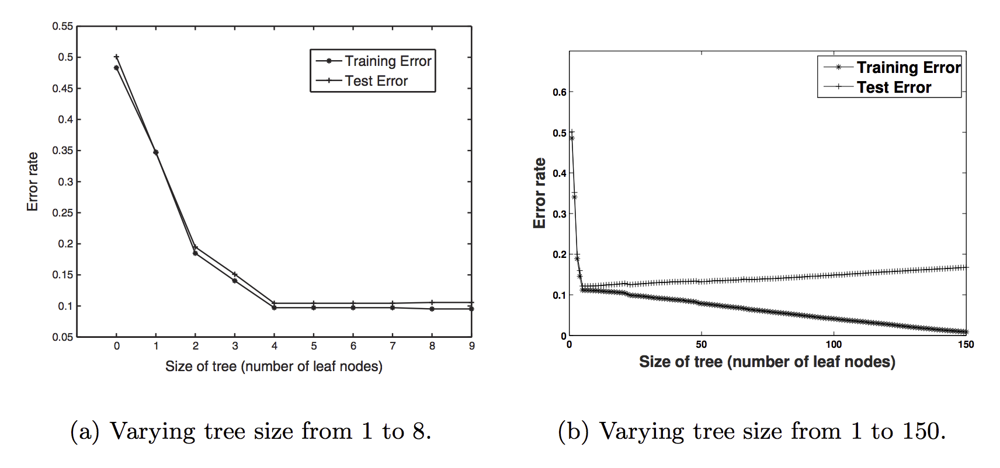

Letting your tree grow indefinitely is both a waste of computation and gives you worse performance.

# Primary reasons that lead to overfitting

* Deficiencies in training dataset (e.g., sample size)
* Model over-complexity (e.g., make assumptions that do not generalize beyond the training data)

# Error bias vs error variance tradeoff 

* The bias error is an error from erroneous assumptions in the learning algorithm. High bias can cause an algorithm to miss the relevant relations between features and target outputs (underfitting).

* The variance is an error from sensitivity to small fluctuations in the training set. High variance can cause an  algorithm to model the random noise in the training data, rather than the intended outputs (overfitting).

* Decision trees generally have low bias but high variance.

Source: https://en.wikipedia.org/wiki/Bias%E2%80%93variance_tradeoff

# So what can we do to minimize error variance?

# Minimize error variance: Minimize overfitting

Enforce limitations on the growth potential of the decision tree. In other words, set constraints on the tree structure/size.

In [194]:
%%HTML
<iframe src='https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier', width=700, height=600></iframe>

# Minimize error variance: Use ensemble methods

   * Bagging
   * Random Forests
   * Boosting

# Property of decision trees: Probabilities of predictions

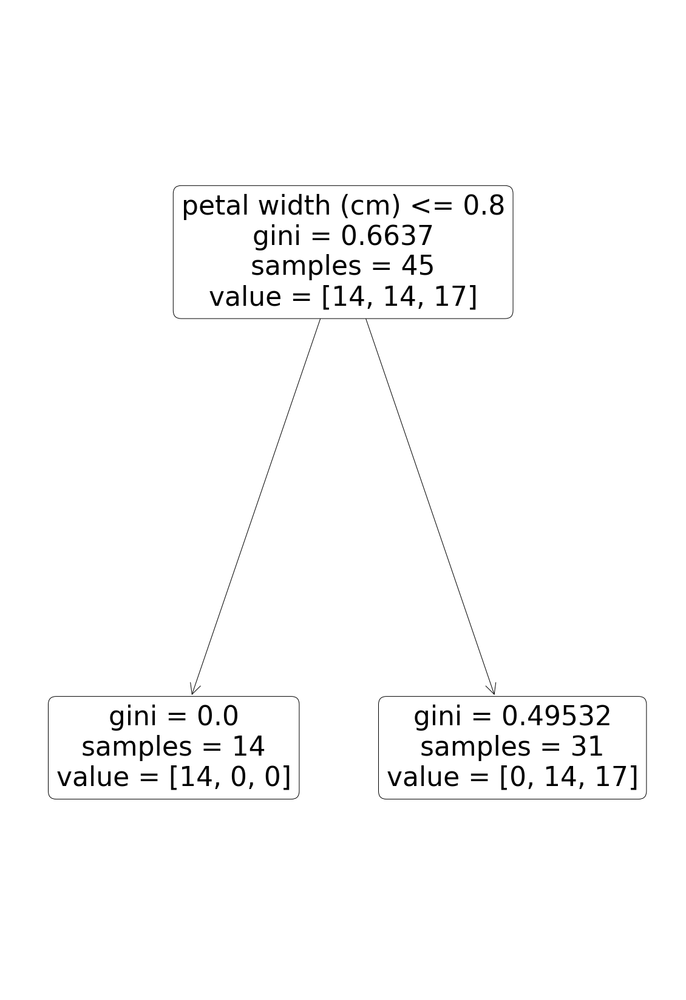

In [196]:
#Decision tree
clf = sklearn.tree.DecisionTreeClassifier(random_state=1,max_depth=1)
#Fit the tree
clf = clf.fit(Xt,yt)
#Plot the tree
plt.figure(figsize=(20,30))
sklearn.tree.plot_tree(clf,feature_names=feature_names,label='all',rounded=True,precision=5)
plt.show()

This will generally only happen if we don't let the tree grow indefinitely (common with environmental spatial data).

# Result? Predict probabilities

In [197]:
clf.predict_proba(Xt)

array([[1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [1.       , 0.       , 0.       ],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.5483871],
       [0.       , 0.4516129, 0.54

# Moving beyond classification: Regression trees

* Very similar to classification trees
* Main difference are the metrics used to determine a node split. 
* Instead of Gini, Entropy, or Classification error we use either mean squared error or mean absolute error.

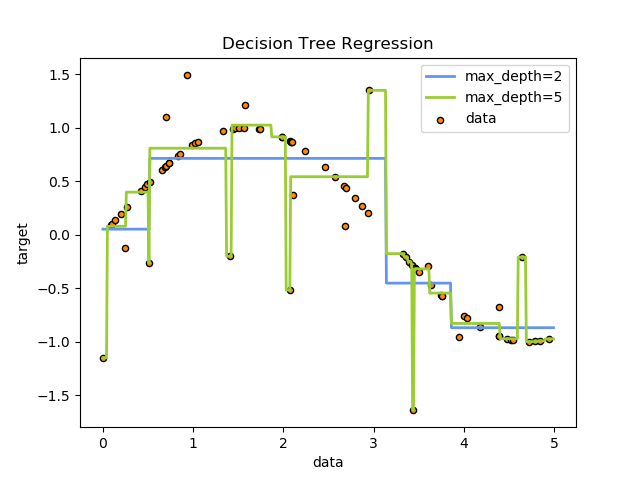